In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio

pio.renderers.default='svg'

In [2]:
## to view complete list of output

pd.set_option("display.max_rows",None)
pd.set_option("display.max_columns",None)
pd.set_option("display.max_colwidth",None)
pd.set_option("display.width",None)

In [3]:
raw_df=pd.read_csv("Zomato Chennai Listing 2020.csv")
raw_df.head()

,Zomato URL,Name of Restaurant,Address,Location,Cuisine,Top Dishes,Price for 2,Dining Rating,Dining Rating Count,Delivery Rating,Delivery Rating Count,Features
0,https://www.zomato.com/chennai/yaa-mohaideen-briyani-1-pallavaram,Yaa Mohaideen Briyani,"336 & 338, Main Road, Pallavaram, Chennai",Pallavaram,['Biryani'],"['Bread Halwa', ' Chicken 65', ' Mutton Biryani', ' Chicken Biryani', ' Brinjal Gravy', ' Basmati Rice', ' Raita']",500.0,4.3,1500,4.3,9306,"['Home Delivery', 'Indoor Seating']"
1,https://www.zomato.com/chennai/sukkubhai-biriyani-alandur,Sukkubhai Biriyani,"New 14, Old 11/3Q, Railway Station Road, MKN Road, Near Antony Church, Alandur, Chennai",Alandur,"['Biryani', ' North Indian', ' Mughlai', ' Desserts', ' Beverages']","['Beef Biryani', ' Beef Fry', ' Paratha', ' Paya', ' Brinjal Curry', ' Chicken 65', ' Chicken Biryani']",1000.0,4.4,3059,4.1,39200,"['Home Delivery', 'Free Parking', 'Table booking recommended', 'Indoor Seating']"
2,https://www.zomato.com/chennai/ss-hyderabad-biryani-kodambakkam,SS Hyderabad Biryani,"98/339, Arcot Road, Opposite Gokulam Chit Funds, Kodambakkam, Chennai",Kodambakkam,"['Biryani', ' North Indian', ' Chinese', ' Arabian']","['Brinjal Curry', ' Tandoori Chicken', ' Chicken Grill', ' Brinjal Gravy', ' Hyderabadi Biryani', ' Mutton Biryani', ' Chicken 65']",500.0,4.3,1361,4.4,10500,"['Home Delivery', 'Indoor Seating']"
3,https://www.zomato.com/chennai/kfc-perambur,KFC,"10, Periyar Nagar, 70 Feet Road, Near Sheeba Hospital, Perambur, Chennai",Perambur,"['Burger', ' Fast Food', ' Finger Food', ' Beverages']",['Zinger Burger'],500.0,4.0,1101,4.0,11200,"['Home Delivery', 'Free Parking', 'Card Upon Delivery', 'Indoor Seating', 'Wifi']"
4,https://www.zomato.com/chennai/tasty-kitchen-perambur,Tasty Kitchen,"135B, SRP Colony, Peravallur, Near Perambur, Chennai",Perambur,"['Chinese', ' Biryani', ' North Indian', ' Chettinad', ' Arabian']","['Mutton Biryani', ' Chicken Rice', ' Tomato Rice', ' Shawarma', ' Egg Fried Rice']",450.0,4.2,617,4.1,22400,"['Home Delivery', 'Indoor Seating']"


In [4]:
## getting basic info about the dataset
raw_df.shape

(12032, 12)

In [5]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12032 entries, 0 to 12031
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Zomato URL             12032 non-null  object 
 1   Name of Restaurant     12032 non-null  object 
 2   Address                12032 non-null  object 
 3   Location               12032 non-null  object 
 4   Cuisine                12032 non-null  object 
 5   Top Dishes             12032 non-null  object 
 6   Price for 2            12032 non-null  float64
 7   Dining Rating          12032 non-null  object 
 8   Dining Rating Count    12032 non-null  object 
 9   Delivery Rating        12032 non-null  object 
 10  Delivery Rating Count  12032 non-null  object 
 11  Features               12032 non-null  object 
dtypes: float64(1), object(11)
memory usage: 1.1+ MB


In [6]:
raw_df.describe()

,Price for 2
count,12032.000000
mean,397.611370
std,332.045938
min,40.000000
25%,200.000000
50%,300.000000
75%,450.000000
max,5000.000000


In [7]:
##Cleaning dataset

In [8]:
##a.dropping columns which are not needed for analysis
raw_df = raw_df.drop(['Zomato URL', 'Address'], axis=1)


In [9]:
raw_df.rename(columns={'Name of Restaurant':'Name','Price for 2':'Price','Dining Rating Count':'Dining Votes','Delivery Rating Count':'Delivery Votes'}, inplace=True)

In [10]:
# Show all duplicate rows in the dataframe
raw_df[raw_df.duplicated()]


,Name,Location,Cuisine,Top Dishes,Price,Dining Rating,Dining Votes,Delivery Rating,Delivery Votes,Features
9103,Brownie Heaven,T. Nagar,"['Bakery', ' Desserts', ' Beverages']",Invalid,350.0,None,Not enough Dining Reviews,None,Not enough Delivery Reviews,"['Home Delivery', 'Indoor Seating', 'Desserts and Bakes']"
9995,ibaco,Kanchipuram District,['Ice Cream'],Invalid,200.0,None,Not enough Dining Reviews,None,Not enough Delivery Reviews,"['Home Delivery', 'Vegetarian Only', 'Indoor Seating', 'Desserts and Bakes']"
10534,Cake Waves,Thiruvallur,"['Bakery', ' Fast Food']",Invalid,500.0,None,Not enough Dining Reviews,None,Not enough Delivery Reviews,"['Home Delivery', 'Indoor Seating', 'Desserts and Bakes']"
11225,Pizza Square,Thiruvanmiyur,"['Pizza', ' Fast Food']",Invalid,300.0,None,Not enough Dining Reviews,None,Not enough Delivery Reviews,"['Home Delivery', 'Indoor Seating']"
11361,Aavin Parlour,George Town,['Ice Cream'],Invalid,200.0,None,Not enough Dining Reviews,None,Does not offer Delivery,"['Takeaway Only', 'Desserts and Bakes']"
11390,The Cake Point,Mogappair,['Bakery'],Invalid,200.0,None,Not enough Dining Reviews,None,Not enough Delivery Reviews,"['Home Delivery', 'Indoor Seating', 'Desserts and Bakes']"
11489,Parantha Pundit,Mogappair,"['North Indian', ' Beverages']",Invalid,200.0,None,Does not offer Dining,None,Not enough Delivery Reviews,['Delivery Only']
11496,Parantha Pundit,Kovalam,"['North Indian', ' Beverages']",Invalid,200.0,None,Does not offer Dining,None,Not enough Delivery Reviews,['Delivery Only']
11553,Leo Coffee,Mylapore,"['Coffee', ' Tea', ' Beverages']",Invalid,250.0,None,Does not offer Dining,None,Not enough Delivery Reviews,['Home Delivery']
11572,Leo Coffee,Anna Nagar East,"['Coffee', ' Tea', ' Beverages']",Invalid,250.0,None,Not enough Dining Reviews,None,Does not offer Delivery,"['Takeaway Only', 'Vegetarian Only']"


In [11]:
# Remove all duplicate rows in the dataframe
raw_df=raw_df.drop_duplicates()
raw_df.count()

Name               11988
Location           11988
Cuisine            11988
Top Dishes         11988
Price              11988
Dining Rating      11988
Dining Votes       11988
Delivery Rating    11988
Delivery Votes     11988
Features           11988
dtype: int64

In [12]:
##b.Checking for NULL RECORDS to remove/replace

In [13]:
raw_df.isnull().sum()

Name               0
Location           0
Cuisine            0
Top Dishes         0
Price              0
Dining Rating      0
Dining Votes       0
Delivery Rating    0
Delivery Votes     0
Features           0
dtype: int64

In [14]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11988 entries, 0 to 12031
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             11988 non-null  object 
 1   Location         11988 non-null  object 
 2   Cuisine          11988 non-null  object 
 3   Top Dishes       11988 non-null  object 
 4   Price            11988 non-null  float64
 5   Dining Rating    11988 non-null  object 
 6   Dining Votes     11988 non-null  object 
 7   Delivery Rating  11988 non-null  object 
 8   Delivery Votes   11988 non-null  object 
 9   Features         11988 non-null  object 
dtypes: float64(1), object(9)
memory usage: 1.0+ MB


In [15]:
#converting numerical columns to numeric datatype



In [16]:
# Checking for text values in the column before converting it to numeric datatype
raw_df[pd.to_numeric(raw_df["Dining Rating"], errors='coerce').isna()]

,Name,Location,Cuisine,Top Dishes,Price,Dining Rating,Dining Votes,Delivery Rating,Delivery Votes,Features
6,Bai Veetu Kalyanam,Navallur,['Biryani'],"['Bread Halwa', ' Mutton Biryani', ' Brinjal Gravy', ' Raita', ' Brinjal Curry']",350.0,None,Does not offer Dining,4.3,1061,['Home Delivery']
77,Al Dhareeq Beef Biriyani,Kodambakkam,['Biryani'],['Beef Biryani'],300.0,None,Does not offer Dining,3.9,19600,['Home Delivery']
106,Twilight Take Out,Nungambakkam,"['North Indian', ' Chinese', ' Rolls', ' Continental', ' Biryani']","['Club Sandwich', ' Chicken Tikka Roll', ' Chicken Grill', ' Chicken Biryani', ' Noodle', ' Cheese Chicken Roll', ' Paneer Tikka Roll']",350.0,None,Does not offer Dining,4.0,11200,"['Home Delivery', 'Free Parking']"
107,The Red Box,Anna Nagar West,['Chinese'],"['Noodle', ' Chilli Chicken Gravy', ' Dragon Chicken', ' Kung Pao Chicken', ' Chicken Lollipop', ' Veg Momos', ' Sweet Corn Chicken Soup']",200.0,None,Does not offer Dining,4.2,11500,['Home Delivery']
114,Charminar Biriyani Centre,Royapettah,"['Biryani', ' North Indian']","['Chicken Biryani', ' Bread Halwa', ' Brinjal Curry', ' Mutton Biryani', ' Brinjal Gravy', ' Tandoori Chicken', ' Raita']",300.0,None,Does not offer Dining,3.9,652,"['Home Delivery', 'Standing Tables']"
136,Fresh Baked Goodness,Abhiramapuram,"['Bakery', ' Desserts']","['Tiramisu Cake', ' Nutella Cheesecake', ' Chocolate Cake', ' Pudding', ' Mousse', ' Chocolate Cupcake', ' Bannoffee Pie']",300.0,None,Does not offer Dining,4.1,1347,"['Home Delivery', 'Pre-Ordering Required', 'Desserts and Bakes', 'Home Baker']"
138,Bombay Lassi,Triplicane,['Street Food'],"['Lassi', ' Samosa', ' Kachori', ' Jalebi', ' Carrot Halwa', ' Milk Halwa', ' Gulab Jamun']",100.0,None,Does not offer Dining,4.3,7457,"['Home Delivery', 'Vegetarian Only']"
264,Night Eat,Choolaimedu,"['North Indian', ' Chettinad', ' Chinese']","['Roti', ' Chicken Tikka Roll', ' Butter Naan', ' Noodle', ' Fried Rice Chicken', ' Rolls', ' Tandoori Chicken']",650.0,None,Does not offer Dining,3.9,20700,['Home Delivery']
274,Chennight Restaurant,Shenoy Nagar,"['Chinese', ' South Indian']","['Shawarma Roll', ' Biryani']",400.0,None,Does not offer Dining,3.1,10,"['Breakfast', 'Home Delivery']"
285,Behrouz Biryani,Nungambakkam,"['Biryani', ' North Indian', ' Mughlai']","['Gulab Jamun', ' Meatballs', ' Chicken Biryani', ' Mint Raita', ' Vegetable Biryani', ' Chocolate Lava', ' Mutton Biryani']",700.0,None,Does not offer Dining,4.1,5154,['Home Delivery']


In [17]:
raw_df[pd.to_numeric(raw_df["Dining Votes"], errors='coerce').isna()]

,Name,Location,Cuisine,Top Dishes,Price,Dining Rating,Dining Votes,Delivery Rating,Delivery Votes,Features
6,Bai Veetu Kalyanam,Navallur,['Biryani'],"['Bread Halwa', ' Mutton Biryani', ' Brinjal Gravy', ' Raita', ' Brinjal Curry']",350.0,None,Does not offer Dining,4.3,1061,['Home Delivery']
77,Al Dhareeq Beef Biriyani,Kodambakkam,['Biryani'],['Beef Biryani'],300.0,None,Does not offer Dining,3.9,19600,['Home Delivery']
106,Twilight Take Out,Nungambakkam,"['North Indian', ' Chinese', ' Rolls', ' Continental', ' Biryani']","['Club Sandwich', ' Chicken Tikka Roll', ' Chicken Grill', ' Chicken Biryani', ' Noodle', ' Cheese Chicken Roll', ' Paneer Tikka Roll']",350.0,None,Does not offer Dining,4.0,11200,"['Home Delivery', 'Free Parking']"
107,The Red Box,Anna Nagar West,['Chinese'],"['Noodle', ' Chilli Chicken Gravy', ' Dragon Chicken', ' Kung Pao Chicken', ' Chicken Lollipop', ' Veg Momos', ' Sweet Corn Chicken Soup']",200.0,None,Does not offer Dining,4.2,11500,['Home Delivery']
114,Charminar Biriyani Centre,Royapettah,"['Biryani', ' North Indian']","['Chicken Biryani', ' Bread Halwa', ' Brinjal Curry', ' Mutton Biryani', ' Brinjal Gravy', ' Tandoori Chicken', ' Raita']",300.0,None,Does not offer Dining,3.9,652,"['Home Delivery', 'Standing Tables']"
136,Fresh Baked Goodness,Abhiramapuram,"['Bakery', ' Desserts']","['Tiramisu Cake', ' Nutella Cheesecake', ' Chocolate Cake', ' Pudding', ' Mousse', ' Chocolate Cupcake', ' Bannoffee Pie']",300.0,None,Does not offer Dining,4.1,1347,"['Home Delivery', 'Pre-Ordering Required', 'Desserts and Bakes', 'Home Baker']"
138,Bombay Lassi,Triplicane,['Street Food'],"['Lassi', ' Samosa', ' Kachori', ' Jalebi', ' Carrot Halwa', ' Milk Halwa', ' Gulab Jamun']",100.0,None,Does not offer Dining,4.3,7457,"['Home Delivery', 'Vegetarian Only']"
264,Night Eat,Choolaimedu,"['North Indian', ' Chettinad', ' Chinese']","['Roti', ' Chicken Tikka Roll', ' Butter Naan', ' Noodle', ' Fried Rice Chicken', ' Rolls', ' Tandoori Chicken']",650.0,None,Does not offer Dining,3.9,20700,['Home Delivery']
274,Chennight Restaurant,Shenoy Nagar,"['Chinese', ' South Indian']","['Shawarma Roll', ' Biryani']",400.0,None,Does not offer Dining,3.1,10,"['Breakfast', 'Home Delivery']"
285,Behrouz Biryani,Nungambakkam,"['Biryani', ' North Indian', ' Mughlai']","['Gulab Jamun', ' Meatballs', ' Chicken Biryani', ' Mint Raita', ' Vegetable Biryani', ' Chocolate Lava', ' Mutton Biryani']",700.0,None,Does not offer Dining,4.1,5154,['Home Delivery']


In [ ]:
raw_df[pd.to_numeric(raw_df["Delivery Rating"], errors='coerce').isna()]

In [ ]:
raw_df[pd.to_numeric(raw_df["Delivery Votes"], errors='coerce').isna()]

In [ ]:

# 1. Convert text to numbers (bad text becomes NaN)
##raw_df['PRICE'] = pd.to_numeric(raw_df['PRICE'], errors='coerce')

# 2. Fill all those NaNs (and original Nones) with 0
##raw_df['PRICE'] = raw_df['PRICE'].fillna(0)

cols_to_convert = ['Dining Rating', 'Dining Votes', 'Delivery Rating','Delivery Votes']

# Converts all three columns, forces errors to NaN, and fills them with 0
raw_df[cols_to_convert] = raw_df[cols_to_convert].apply(pd.to_numeric, errors='coerce').fillna(0)

In [ ]:
## Checking for text values in the column before converting it to numeric datatype
raw_df[pd.to_numeric(raw_df["Delivery Votes"], errors='coerce').isna()]

raw_df[pd.to_numeric(raw_df["Dining Rating"], errors='coerce').isna()]

raw_df[pd.to_numeric(raw_df["Dining Votes"], errors='coerce').isna()]
raw_df[pd.to_numeric(raw_df["Delivery Votes"], errors='coerce').isna()]

In [ ]:
#changing the datatype of numeric value column from float to int
raw_df["Delivery Votes"]=raw_df["Delivery Votes"].astype('int64')
raw_df["Dining Votes"]=raw_df["Dining Votes"].astype('int64')


In [ ]:
## Removing the rows with RATING OR VOTES is 0

In [ ]:
# find the restaurants with 0 rating or vote

useless_data= ((raw_df["Delivery Votes"]==0) | (raw_df["Delivery Rating"]==0)) & ((raw_df["Dining Votes"]==0) | (raw_df["Dining Rating"]==0))
#raw_df[~useless_data]

useless_data= ((raw_df["Delivery Votes"]==0) | (raw_df["Delivery Rating"]==0)) | ((raw_df["Dining Votes"]==0) | (raw_df["Dining Rating"]==0))


In [ ]:
#Permanently removing the useless data with Rating or Votes 0
raw_df=raw_df[~useless_data]

In [ ]:
##Working on Location column
raw_df['Location'].value_counts()

In [ ]:
### To split and get the data after ", "(eg:Phoenix Market City, Velachery) 
split_df = raw_df['Location'].str.split(", ", n=1, expand=True)
# 2. Take the "after" part (1), fill missing values with the "before" part (0)
raw_df['Location'] = split_df[1].fillna(split_df[0])

In [ ]:
### To split and get the data after ", "(eg:Express Avenue Mall,Royapettah) 
split_df = raw_df['Location'].str.split(",", n=1, expand=True)

# 2. Take the "after" part (1), fill missing values with the "before" part (0)
raw_df['Location'] = split_df[1].fillna(split_df[0])

raw_df['Location'].value_counts()

In [ ]:
### To split and get the data after ", "(Old Mahabalipuram Road (OMR)) 
split_df = raw_df['Location'].str.split("(", n=1, expand=True)

# 2. Take the "after" part (1), fill missing values with the "before" part (0)
raw_df['Location'] = split_df[1].fillna(split_df[0])

raw_df['Location'].value_counts()

In [ ]:
raw_df['Location']=raw_df['Location'].str.replace(r'\)', '', regex=True)

raw_df['Location'] = raw_df['Location'].str.strip()
raw_df['Location'].value_counts()

In [ ]:
## Changing the values (not in location) to known location


raw_df['Location'].replace(to_replace=["East...","Grande Bay Resort"] , value='ECR',inplace=True)
raw_df['Location'].replace(to_replace=["Old Mahabalipuram Road" ,"Holiday Inn Chennai OMR IT Expressway","Novotel Chennai Sipcot"] 
                           , value='OMR',inplace=True)
raw_df['Location'].replace(to_replace=["The Slate"] , value='Nungambakkam',inplace=True)
raw_df['Location'].replace(to_replace=["Grand by GRT Hotels"] , value='T.Nagar',inplace=True)
raw_df['Location'].replace(to_replace=["Citadines"] , value='Sholinganallur',inplace=True)
raw_df['Location'].replace(to_replace=["A radha hotel"] , value='Manapakkam',inplace=True)
raw_df['Location'].replace(to_replace=["Foodies kitchen"] , value='Thiruvanmiyur',inplace=True)
raw_df['Location'].replace(to_replace=["V7 Hotel"] , value='Porur',inplace=True)
raw_df['Location'].value_counts()




In [ ]:
### To remove [] from Cuisine column values
split_df = raw_df['Cuisine'].str.split("[", n=1, expand=True)
# 2. Take the "after" part (1), fill missing values with the "before" part (0)
raw_df['Cuisine'] = split_df[1].fillna(split_df[0])
raw_df['Cuisine']=raw_df['Cuisine'].str.replace(r'\]', '', regex=True)


In [ ]:
#To remove '' in the values
raw_df['Cuisine']=raw_df['Cuisine'].str.replace(r'\' ', '', regex=True)
raw_df['Cuisine']=raw_df['Cuisine'].str.replace(r'\'', '', regex=True)
raw_df['Cuisine'] = raw_df['Cuisine'].str.strip()
raw_df['Cuisine'].value_counts()

In [ ]:
### To remove [] from Top Dishes column values
split_df = raw_df['Top Dishes'].str.split("[", n=1, expand=True)


# Removes ']', extra spaces around single quotes, and single quotes in one step
raw_df['Top Dishes'] = split_df[1].str.replace(r"\]|' |'","", regex=True)

raw_df['Top Dishes'].value_counts()



In [ ]:
### To remove [] from Features column values
split_df = raw_df['Features'].str.split("[", n=1, expand=True)


# Removes ']'and single quotes in one step
raw_df['Features'] = split_df[1].str.replace(r"\]|'","", regex=True)

raw_df['Features'].value_counts()

In [ ]:

# Copying cleaned dataset to another dataset

zomato_df=raw_df.copy()

zomato_df.info()

In [ ]:
#5. Performing Exploratory Data Analysis
#Q1) How many restaurants are in Chennai for each type of cuisine?


/Users/Max/opt/anaconda3/lib/python3.8/site-packages/plotly/io/_renderers.py:51: UserWarning: Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.0 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.
  warnings.warn(


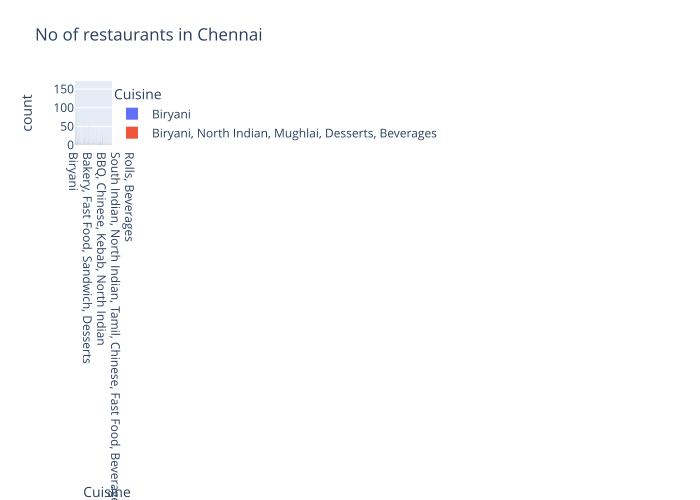

In [38]:
fig=px.histogram(zomato_df,x='Cuisine',color='Cuisine',
                 title='No of restaurants in Chennai',
                labels={'Name':'Restaurants in Chennai'})
fig.show()

In [39]:
##Q2) What are the percentage of restaurants by Dining Rating in Chennai?

In [40]:
Dining_Rating_df=zomato_df["Dining Rating"].value_counts().reset_index()
Dining_Rating_df.rename(columns={'index':'Dining Rating', 'Dining Rating':'COUNT OF RESTAURANTS'}, inplace=True)
Dining_Rating_df

,Dining Rating,COUNT OF RESTAURANTS
0,3.7,387
1,3.6,377
2,3.5,359
3,3.8,334
4,3.4,320
5,3.9,301
6,3.3,293
7,3.2,260
8,3.1,236
9,4.0,222


Resorting to unclean kill browser.
/Users/Max/opt/anaconda3/lib/python3.8/site-packages/plotly/io/_renderers.py:51: UserWarning: Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.0 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.
  warnings.warn(


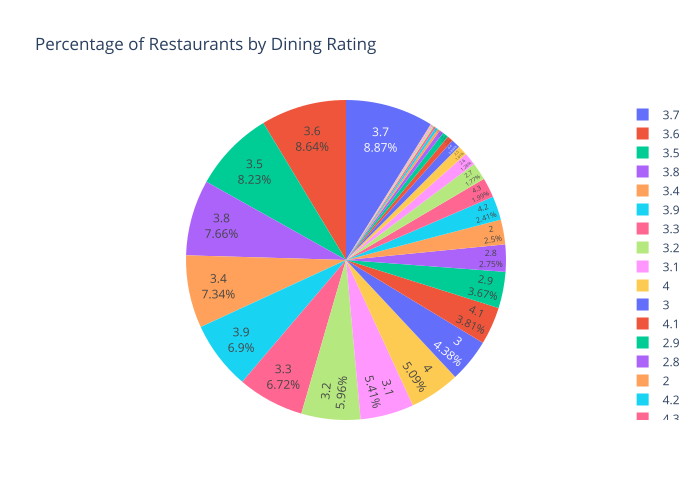

In [41]:
fig = px.pie(Dining_Rating_df, names='Dining Rating', values='COUNT OF RESTAURANTS', color='Dining Rating',
 title='Percentage of Restaurants by Dining Rating').update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [42]:
##Q3 Find 10 Restaurants in Chennai by Cuisine

Resorting to unclean kill browser.
/Users/Max/opt/anaconda3/lib/python3.8/site-packages/plotly/io/_renderers.py:51: UserWarning: Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.0 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.
  warnings.warn(


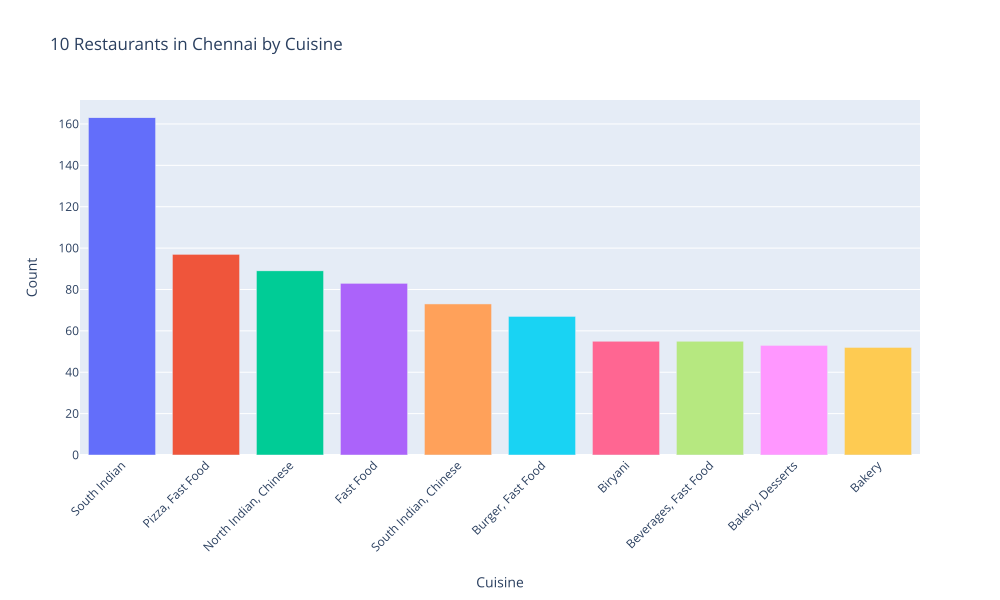

In [43]:
import plotly.express as px

# Top 10 cuisines
top_cuisine = zomato_df['Cuisine'].value_counts().head(10)

fig = px.bar(
    x=top_cuisine.index,
    y=top_cuisine.values,
    color=top_cuisine.index,
    title='10 Restaurants in Chennai by Cuisine',
    labels={
        'x': 'Cuisine',
        'y': 'Count'
    }
)

fig.update_layout(
    xaxis_tickangle=-45,
    showlegend=False,
    width=1000,
    height=600
)

fig.show()

In [44]:
##Q4) Which are the Top 10 highest rated Chinese Restaurant in Chennai?

Chinese_df=zomato_df[zomato_df['Cuisine'].str.contains("Chinese")]
Chinese_df.sort_values(by='Dining Rating',ascending=False).head(10)

,Name,Location,Cuisine,Top Dishes,Price,Dining Rating,Dining Votes,Delivery Rating,Delivery Votes,Features
163,Momo Sa-Khang by Kailash Kitchen,Choolaimedu,"Momos, Chinese","Momos, Noodle, Chowmein, Fried Momo, Chop Suey, Dumplings, Thukpa",350.0,4.8,1658,4.5,2825,"Home Delivery, Free Parking, Indoor Seating"
195,The Marina,Nungambakkam,"Seafood, North Indian, Chinese","Sea Food, Jumbo Prawns, Biryani, Fish Mango Curry, Calamari, Lobster, Prawn",1600.0,4.8,1082,4.3,373,"Home Delivery, Indoor Seating, Table reservation required"
102,Mainland China,Velachery,"Chinese, Asian, Sushi, Japanese, Thai","Noodle, Dumplings, Momos, Hakka Noodles, Mocktails, Jumbo Prawns, Kimchi",1800.0,4.6,1498,4.2,335,"Home Delivery, Mall Parking, Valet Parking Available, Table booking recommended, Indoor Seating"
382,Wok Monk,Anna Nagar West,"Asian, Chinese, Middle Eastern","Dumplings, Chocolate Tsunami, Pizza, Momos, Mushroom Satay, Chicken Pad Thai, Tom Yum Soup",1200.0,4.6,459,3.9,659,"Home Delivery, Indoor Seating"
9037,Palmshore,Medavakkam,"North Indian, Chinese, Arabian, BBQ, Biryani, Beverages","Mutton Mandi, Biryani, Brownie, Bbq Fish, Bbq Chicken, Prawn, Faluda",1000.0,4.5,1942,3.8,4379,"Home Delivery, Valet Parking Available, Indoor Seating, Table booking recommended, Bulk Orders Accepted, Card Upon Delivery, Catering Available, Outdoor Seating, Table booking for Groups, Available for Functions, Buffet"
110,VB Signature,Nungambakkam,"North Indian, South Indian, Chinese, Asian, Fast Food, Desserts, Beverages","Momos, Idiyappam, Pumpkin Soup, Coconut Soup, Filtered Coffee, Noodle, Paneer Tikka",1000.0,4.5,1611,3.8,750,"Breakfast, Home Delivery, Vegetarian Only, Live Sports Screening, Table booking recommended, Indoor Seating"
9363,Flower Drum,Adyar,"Chinese, Thai","Momos, Noodle, Dimsum Platter, Schezwan Fried Rice, Thai Green Curry, Manchow Soup, Dumplings",800.0,4.5,617,4.3,819,"Home Delivery, Wheelchair Accessible, Vegetarian Only, Free Parking, Table booking recommended, Wifi, Indoor Seating, Buffet"
243,Asia Kitchen by Mainland China,Nungambakkam,"Momos, Asian, Chinese, Sushi","Dumplings, Mocktails, Fish, Treasure Soup, Khau Suey, Sushi, Prawn",1800.0,4.5,872,4.1,882,"Home Delivery, Valet Parking Available, Buffet, Indoor Seating"
9273,Ratna Cafe,Triplicane,"South Indian, Chinese, Street Food, Beverages","Filtered Coffee, Idli Sambar, Pongal, Crispy Dosa, Masala Dosa, Vada, Plain Dosa",400.0,4.5,1083,4.3,3596,"Breakfast, Home Delivery, Vegetarian Only, Indoor Seating"
207,Va Pho - Asian Canteen,Gopalapuram,"Asian, Chinese, Beverages","Noodle, Mocktails, Beef Sate, Momos, Faluda, Tom Yum Soup, Chicken Satay",1400.0,4.5,1040,3.9,145,"Home Delivery, Valet Parking Available, Table reservation required, Indoor Seating"


In [45]:
##Q5) What is the Avg Price Distibution of highest rated restaurant for each Location in Chennai?
highest_rated_df = zomato_df[zomato_df['Dining Rating'] >= 4.5]
highest_rated_price_df = highest_rated_df.groupby(by=['Location'])['Price'].mean().reset_index()


In [46]:
##Q7) Which areas have a large number of Seafood Restaurant Market?

Seafood_df = zomato_df[zomato_df['Cuisine'].str.contains('Seafood')]


In [47]:
Seafood_rest_df = Seafood_df.groupby(by='Location').agg({'Name': 'count', 'Price': 'mean'}).rename(columns={'Name': 'COUNT OF RESTAURANTS'})
Seafood_rest_df = Seafood_rest_df.sort_values('COUNT OF RESTAURANTS', ascending=False).head(25)
Seafood_rest_df.head()

,COUNT OF RESTAURANTS,Price
Location,,
Nungambakkam,7,1114.285714
Velachery,6,725.000000
Thuraipakkam,6,758.333333
Porur,6,683.333333
Anna Nagar West,6,691.666667


In [48]:
Seafood_rest_df = Seafood_df.groupby('Location').agg({'Name': 'count', 'Price': 'mean'}).reset_index()
Seafood_rest_df.rename(columns={'Name': 'COUNT OF RESTAURANTS'}, inplace=True)
Seafood_rest_df = Seafood_rest_df.sort_values('COUNT OF RESTAURANTS', ascending=False).head(25)
Seafood_rest_df.head()

,Location,COUNT OF RESTAURANTS,Price
34,Nungambakkam,7,1114.285714
64,Velachery,6,725.000000
60,Thuraipakkam,6,758.333333
43,Porur,6,683.333333
6,Anna Nagar West,6,691.666667


/Users/Max/opt/anaconda3/lib/python3.8/site-packages/plotly/io/_renderers.py:51: UserWarning: Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.0 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.
  warnings.warn(


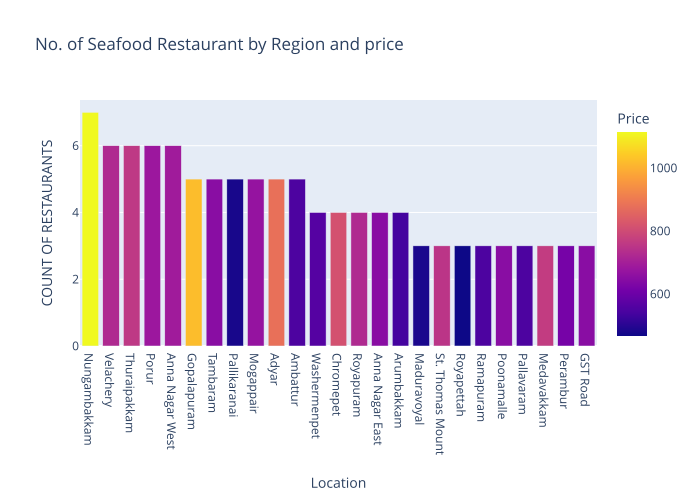

In [49]:
fig = px.bar(Seafood_rest_df, x='Location', y='COUNT OF RESTAURANTS', color='Price', title= 'No. of Seafood Restaurant by Region and price')
fig.show()

In [50]:
#Q9) Is there a relation between Location and Price?
region_price_df=zomato_df.groupby(by="Location")["Price"].mean().reset_index()

/Users/Max/opt/anaconda3/lib/python3.8/site-packages/plotly/io/_renderers.py:51: UserWarning: Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.4.0 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.
  warnings.warn(


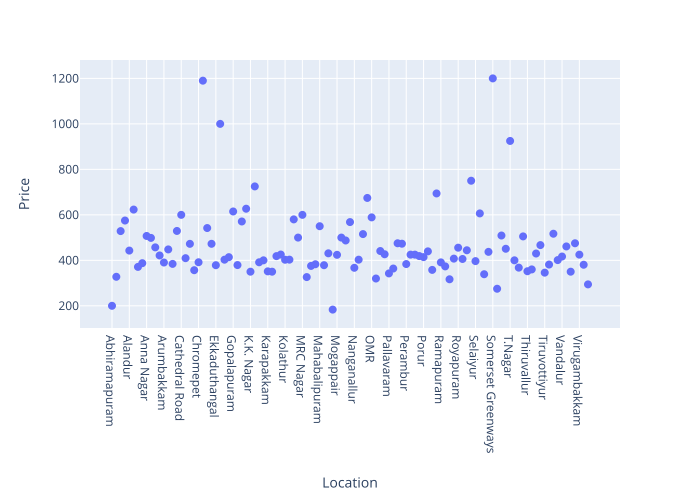

In [51]:
fig = px.scatter(region_price_df, x="Location", y="Price").update_traces(marker_size=8)
fig.show()

In [52]:
##Q10) Find the list of Affordable Restaurants?
'''The criteria for Affordable Restaurants would be:-
1) Low Price 2) High Rated
First step will be to find the restaurants with average cost 1/4th the average cost of most expensive restaurant in our dataframe.
Let me explain:-The most expensive restaurant has an average meal cost= 6000. We'll try to stay economical and only pick the
restaurants that are 1/4th of 3000.'''

"The criteria for Affordable Restaurants would be:-\n1) Low Price 2) High Rated\nFirst step will be to find the restaurants with average cost 1/4th the average cost of most expensive restaurant in our dataframe.\nLet me explain:-The most expensive restaurant has an average meal cost= 6000. We'll try to stay economical and only pick the\nrestaurants that are 1/4th of 3000."

In [53]:
max_price = zomato_df['Price'].max()
one_fourth_price = max_price/4
one_fourth_price

750.0

In [54]:
# Finding list of restaurants that have price less than and equal to 1/4th of the max price i.e Finding Cheap Restaurants
aff_rest_df = zomato_df[['Name', 'Price', 'Cuisine', 'Location', 'Top Dishes']]
aff_rest_df = aff_rest_df[aff_rest_df['Price'] <= 1250]
aff_rest_df.sort_values(by='Price', inplace=True)


In [55]:
# Finding the highest rated list of restaurants
highrate_rest_df = zomato_df[['Name', 'Price', 'Cuisine', 'Location', 'Top Dishes','Dining Rating']]
highrate_rest_df = highrate_rest_df[highrate_rest_df['Dining Rating'] >= 4.5]
highrate_rest_df.sort_values(by='Price', inplace=True)


In [56]:
highrate_aff_df = pd.merge(aff_rest_df, highrate_rest_df, how='inner', on=['Name', 'Location'])

highrate_aff_df = highrate_aff_df[['Name', 'Price_x', 'Cuisine_x', 'Location','Top Dishes_x']]
highrate_aff_df.rename(columns={'Name':'Name', 'Price_x':'Price', 'Cuisine_x':'Cuisine','Location':'Location','Top Dishes_x':'Top Dishes'},inplace=True)
 ### Affordable Restaurants with low price and high rating 

In [57]:
##Q10) Find the list of most Reliable Restaurants?
'''The criteria for most Reliable Restaurants would be:-
1) Low Price 2) High Rated 3) Large No. of Votes
First step will be to find the restaurants with Votes greater than Mean of Votes'''

mean_votes = zomato_df['Dining Votes'].mean()


In [58]:
# Finding list of restaurants that have Votes greater than and equal to Mean of Vote
mean_rest_df = zomato_df[['Name', 'Price', 'Cuisine', 'Location', 'Top Dishes','Dining Votes']]

mean_rest_df = mean_rest_df[mean_rest_df['Dining Votes'] > 170]
mean_rest_df.sort_values(by='Dining Votes', inplace=True)


In [59]:
'''These are the most reliable, highest rated and affordable restaurants:-
We obtain this dataframe by simply taking the intersection of highrate_aff_df & mean_rest_df
This dataframe obtained below shows the restaurants whose:
Cost is below 750
Rating is above 4.5
Votes are above 170'''

'These are the most reliable, highest rated and affordable restaurants:-\nWe obtain this dataframe by simply taking the intersection of highrate_aff_df & mean_rest_df\nThis dataframe obtained below shows the restaurants whose:\nCost is below 750\nRating is above 4.5\nVotes are above 170'

In [60]:
reliable_rest_df = pd.merge(mean_rest_df, highrate_aff_df, how='inner', on=['Name', 'Location'])
reliable_rest_df = reliable_rest_df[['Name', 'Price_x', 'Cuisine_x', 'Location', 'Top Dishes_x']]
reliable_rest_df.rename(columns={'Name':'Name', 'Price_x':'Price', 'Cuisine_x':'Cuisine',
 'Location':'Location', 'Top Dishes_x':'Top Dishes'},inplace=True)

In [61]:
reliable_rest_df

,Name,Price,Cuisine,Location,Top Dishes
0,Shmoozie's Hand-Crafted Ice Creams,400.0,"Ice Cream, Desserts",Egmore,"Salted Caramel, Brownie, Bannoffee Pie, Coffee, Masala Chai, Caramel Ice Cream, Mango Ice Cream"
1,Kuuraku,1200.0,Japanese,Vadapalani,"Ramen, Sushi, Tea, Yakitori Don, Tempura, Salad, Gyoza"
2,Bombay Kulfi,200.0,Ice Cream,Anna Nagar East,"Calcutta Paan, Tender Coconut Kulfi, Paan Ice Cream, Coffee, Malai Kulfi, Choco Almond, Pista Kulfi"
3,Wok Monk,1200.0,"Asian, Chinese, Middle Eastern",Anna Nagar West,"Dumplings, Chocolate Tsunami, Pizza, Momos, Mushroom Satay, Chicken Pad Thai, Tom Yum Soup"
4,Blind Ch3mistry,700.0,"Cafe, Continental, Italian, Desserts, Beverages",Teynampet,"Pasta, Cheese Corn Balls, Pizza, Chocolate Pani Puri, Peri Fries, French Fries, Chicken Wings"
5,Writer's Cafe,600.0,"Cafe, American",Taramani,"Hot Chocolate, Pizza, Pasta, Waffles, Spaghetti, Salad, Jalapeno Cheeseballs"
6,Bombay Kulfi,200.0,Ice Cream,Adyar,"Kesar Pista Kulfi, Malai Kulfi, Chocolate Kulfi, Roasted Almonds, Mango Kulfi, Paan Kulfi, Coffee Walnut"
7,The Sandwich Shop,300.0,"Sandwich, Fast Food, Beverages",West Mambalam,"Mocktails, Fries, Pizza Sandwich, Tandoori Sandwich, Chocolate Sandwich, Burgers, Mojito"
8,Fruit Shop On Greams Road,350.0,"Beverages, Fast Food, Healthy Food, Juices",Thousand Lights,"Fruit Juices, Sandwich, Mint Lime Cooler, Tender Coconut Pudding, Fruit Salad, Faluda, Milk Shake"
9,Flower Drum,800.0,"Chinese, Thai",Adyar,"Momos, Noodle, Dimsum Platter, Schezwan Fried Rice, Thai Green Curry, Manchow Soup, Dumplings"
